<a href="https://colab.research.google.com/github/andresvillamayor/Ejemplos_ML/blob/main/Eda_Musicas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Contexto
**Sistema de Recomendacion de Musica**

**Resumen**

*El proyecto propuesto se centra en el desarrollo de un sistema de recomendación de música utilizando técnicas de Big Data. La idea es analizar grandes volúmenes de datos relacionados con las preferencias y comportamientos de escucha de los usuarios para generar recomendaciones de canciones y artistas que puedan ser de su interés. El sistema utilizará algoritmos de aprendizaje automático y técnicas de procesamiento de datos a gran escala para identificar patrones y similitudes entre los usuarios y las músicas, proporcionando recomendaciones personalizadas que mejoran la experiencia de usuario en plataformas de streaming de música*

# Procesamiento de datos


- 1 - Procesamiento de datos de List Music
- 2 - Pocesamiento de datos de la lista Musical de Spotify  

**Los Modelos de Clasificacion utilizados seran los siguientes Modelos:

- K-Means
- Deep Learning

A su vez estos calsificadores tendran un input de muestras de un List Musica
que tienen son Procesados por Moledo:

- Randon Forrest
---


## Objetivo del Proyecto
1.	Análisis Exploratorio de Datos:
•	Investigar y entender las características y patrones en los datos disponibles (historiales de reproducción, preferencias de género, valoraciones de usuarios, etc.).
2.	Preprocesamiento de Datos:
•	Limpiar y estructurar los datos para su posterior análisis.
•	Gestionar y almacenar grandes volúmenes de datos de manera eficiente utilizando tecnologías de Big Data.
3.	Desarrollo de Modelo de Recomendación:
•	Implementar y entrenar modelos de aprendizaje automático utilizando técnicas de filtrado colaborativo, basado en contenido o utilizando técnicas híbridas.
•	Validar y optimizar el modelo utilizando conjuntos de datos de entrenamiento y prueba.


---

Importar librerias

In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import accuracy_score
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
%matplotlib inline
import difflib
import plotly.express as px
import ast
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import missingno as msno

---
*Diccionario de datos de Spotify para comprender el tipo y el dato que se esta manejando en los modelos y porque su importancia*

## Diccionario de Datos de Spotify
- id = *id del track*
- name = *nombre del track*
- popularity = *popularidad del track en rango del 0 a 100*
- duracion_ms  = *duracion del sonido en milisegundos (ms)*
- explicit = *Si contiene musica explicita o no*
- artists = *Nombre o Agrupacion del Artista*
- release_date = *fecha de lanzamiento*
- danceability = *que tan bailable es una canción en rango de 0 a 1*
- energy = *que tan energética es una canción de 0 a 1*
- key = *nota en la que esta el track [0: C, 1: C#/Db, 2: D, …]*
- loudness = *que tan ruidosa es una canción*
- mode = *el modo de la canción, 0 es menor, 1 es mayor*
- speechiness = *presencia de palabras habladas, de 0 a 1*
- acousticness = *que tan acústico es el track, de 0 a 1*
- instrumentalness = *ausencia de sonidos vocales, rango de 0 a 1*
- liveness = *presencia de público, de 0 a 1*
- valence = *positividad, de 0 a 1*
- tempo = *tempo del track, BPM*
- time_signature = *compas, generalmente 4 que es 4/4*
---

## Analisis Descriptivo de los Datos

- Datos de registros de musica de Spotify
- Datos de registros de la lista


**Lectura de datos de musica de Spotify**

In [ ]:
songs_df = pd.read_csv("./musics.csv")

In [ ]:
print ('Candidad de filas es de :',songs_df.shape[0])
print ('Cantidad de columnas es de :', songs_df.shape[1])

Candidad de filas es de : 170653
Cantidad de columnas es de : 19


**Verificacion de datos del DataSet de Spotify**
- Datos Nulos
- Informacion de los datos

In [ ]:
print(songs_df.isna().sum())
print('-----------------')
print('SIN VALORES NULOS')

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64
-----------------
SIN VALORES NULOS


In [ ]:
songs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
songs_df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


**Lectura de datos de la lista de musica sacar de un persona aleatoriamente**

In [ ]:
list_df = pd.read_csv('./liked.csv')

In [ ]:
print ('Candidad de filas es de :',list_df.shape[0])
print ('Cantidad de columnas es de :', list_df.shape[1])

Candidad de filas es de : 2017
Cantidad de columnas es de : 17


**Verificar los valores que no contenga valores nulos**

In [ ]:
print(list_df.isna().sum())
print('-----------------')
print('SIN VALORES NULOS')

Unnamed: 0          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
target              0
song_title          0
artist              0
dtype: int64
-----------------
SIN VALORES NULOS


**Verificando los datos de la lista de like : list music**

In [ ]:
list_df.head()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


**Dentro del Esquema de la lista musical el cual tiene un columna Target para verficicar si el modelo al cual podemos aplicar este data set pueda tener mayo acierto**

**Se limpiara el data set correspondiente a la list**

- **Key** =  viene codificado, El valor correcto es la nota de la tonalidad de la musica Ej: DO Menor , SOL ( Cm - G)
- **time_signature**  = es el compas de la musica Ej: 4x4 significa que tiene 4 golpes de negra

**Limpiamos el data set**

In [ ]:
list_df.drop(['Unnamed: 0','time_signature'], axis = 1, inplace = True)

**Verificamos la Data nuevamente**

In [ ]:
list_df.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,target,song_title,artist
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,0.286,1,Mask Off,Future
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,0.588,1,Redbone,Childish Gambino
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,0.173,1,Xanny Family,Future
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,0.230,1,Master Of None,Beach House
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,0.904,1,Parallel Lines,Junior Boys


---
## Aplicando Modelo de RandomForrestClassifier
- Se ejectua el esquema de modelo al la Lista de *liked.csv* de una lista aleatoria de musica escuchadas por un persona elegida aleatoriamente

**Usando el Holdout Method**

**Importamos Libreria**

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

**Modelo Random Forrest**

- Utilizando *stratify* 75/25
- Con **stratify** nos aseguramos de que los bloques generados van a contener un porcentaje semejante de, en este caso, los valores contenidos en $y$.

In [ ]:
features = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","mode","key"]
X = list_df[features]
y = list_df['target']
model = RandomForestClassifier(n_estimators=100)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state = 0)
print("Cantidad de Registros para Training : {}; Cantidad de Registros para Test : {}".format(len(X_train), len(X_test)))
model.fit(X_train, y_train)
forest_y_pred = model.predict(X_test)
score = accuracy_score(y_test, forest_y_pred) * 100
modelscore = model.score(X_train,y_train) * 100
rounded_score = round(score, 1)
print("Random Forest Accuracy: (num_estimadores: 100) Accuracy: {}%".format(rounded_score))
print("Random Forest Score : (num_estimadores: 100) Score: {}%".format(modelscore))

Cantidad de Registros para Training : 1512; Cantidad de Registros para Test : 505
Random Forest Accuracy: (num_estimadores: 100) Accuracy: 79.2%
Random Forest Score : (num_estimadores: 100) Score: 99.8015873015873%


**Matriz de Confusion**

In [ ]:
Rf = RandomForestClassifier(n_estimators = 100)
Rf.fit(X_train, y_train)
Rf_pred = Rf.predict(X_test)
conf_mat = confusion_matrix(y_test, Rf_pred)
print(conf_mat)

[[198  52]
 [ 56 199]]


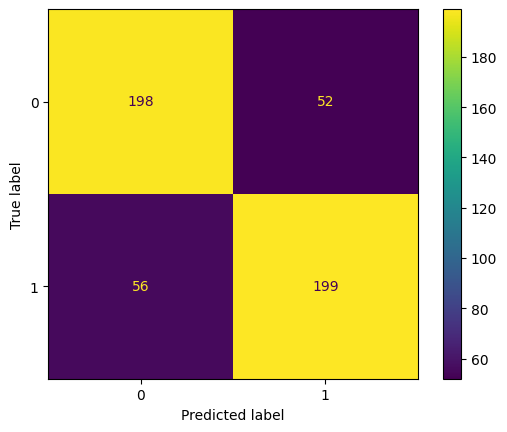

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test, Rf_pred)
plt.show()

---
# Machine Learning
## Funciones Definidas para Modelos
- Impresion e inputs de las musicas que seran probadas en los modelos
- Definición de la lista de pruebas de canciones para ambos modelos.


- Inputs musicales

In [ ]:
songs_testing_list_1 = [{'name': 'Classic', 'year':2013},
                        {'name': 'Losing Sleep', 'year': 2017},
                        {'name': 'Catamaran', 'year': 2012},
                        {'name': 'Hands On The Wheel', 'year': 2012}]
# Nirvana
songs_testing_list_2 = [{'name': 'Come As You Are', 'year':1991},
                       {'name': 'Smells Like Teen Spirit', 'year': 1991},
                       {'name': 'Lithium', 'year': 1992},
                       {'name': 'All Apologies', 'year': 1993}]
# Metallica - Iron Maiden
songs_testing_list_3 = [{'name': 'Seek & Destroy', 'year':1983},
                       {'name': 'Whiplash', 'year': 1983},
                       {'name': 'Moonchild', 'year': 1988},
                       {'name': 'The Trooper', 'year': 1983}]

- Funcion de Impresion de las musicas recomendadas

In [ ]:
def pretty_print_songs(df):
    metadata_cols = ['name', 'year', 'artists']
    songs = df[metadata_cols].to_dict(orient='records')

    for idx, song in enumerate(songs, 1):
        artist_list = ast.literal_eval(song['artists'])
        artist_str = ', '.join(artist_list)
        print(f"{idx}. {song['name']} ({song['year']}) by {artist_str}\n")

---
# Clustering de Musica con K-Means

**Proceso de análisis de Clúster**
- **1:** Seleccion de Variables
    - La clasificación dependerá de las variables elegidas. Introducir variables irrelevantes aumenta la posibilidad de errores. Hay que utilizar algún criterio de selección:
        - Seleccionar sólo aquellas variables que caracterizan los objetos que se van agrupando, y referentes a los objetivos del análisis clúster que se va a realizar.
        - Si el número de variables es muy grande se puede realizar previamente un Análisis de Componentes Principales y resumir el conjunto de variables( Ej: Uso de PCA)

In [ ]:
X = songs_df.select_dtypes(np.number)

In [ ]:
X

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
0,0.0594,1921,0.98200,0.279,831667,0.211,0,0.878000,10,0.6650,-20.096,1,4,0.0366,80.954
1,0.9630,1921,0.73200,0.819,180533,0.341,0,0.000000,7,0.1600,-12.441,1,5,0.4150,60.936
2,0.0394,1921,0.96100,0.328,500062,0.166,0,0.913000,3,0.1010,-14.850,1,5,0.0339,110.339
3,0.1650,1921,0.96700,0.275,210000,0.309,0,0.000028,5,0.3810,-9.316,1,3,0.0354,100.109
4,0.2530,1921,0.95700,0.418,166693,0.193,0,0.000002,3,0.2290,-10.096,1,2,0.0380,101.665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,0.786,301714,0.808,0,0.000289,7,0.0822,-3.702,1,72,0.0881,105.029
170649,0.7340,2020,0.20600,0.717,150654,0.753,0,0.000000,7,0.1010,-6.020,1,68,0.0605,137.936
170650,0.6370,2020,0.10100,0.634,211280,0.858,0,0.000009,4,0.2580,-2.226,0,76,0.0809,91.688
170651,0.1950,2020,0.00998,0.671,337147,0.623,1,0.000008,2,0.6430,-7.161,1,70,0.3080,75.055



**El método Elbow**
 - También conocido como método del codo, sigue una estrategia comúnmente empleada para encontrar el valor óptimo de un hiperparámetro. La idea es probar un rango de valores del hiperparámetro en cuestión, representar gráficamente los resultados obtenidos con cada uno, e identificar aquel punto de la curva (codo) a partir del cual la mejora deja de ser notable.
 - En los casos de partitioning clustering, como por ejemplo K-means, las observaciones se agrupan de una forma tal que se minimiza la varianza total intra-cluster. El método Elbow calcula la varianza total intra-cluster en función del número de clusters y escoge como óptimo aquel valor a partir del cual añadir más clusters apenas consigue mejoría.

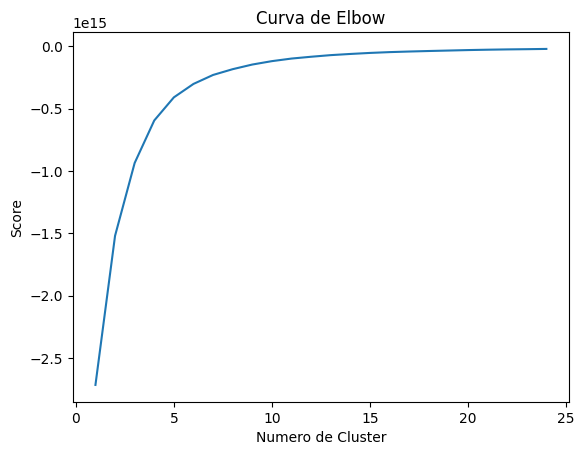

In [ ]:
ClusterK = range(1, 25)
kmeans = [KMeans(n_clusters=i) for i in ClusterK]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(ClusterK,score)
plt.xlabel('Numero de Cluster')
plt.ylabel('Score')
plt.title('Curva de Elbow')
plt.show()

**Recomendacion**
- Dentro del Kmeans la recta que se ve en la curva de Elbow, comienza a estabilizar a partir del cluster 20 , por lo cual usaremos esa cantidad para ver el comportamiento.

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=20, verbose=False))], verbose=False)
X = songs_df.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
songs_df['cluster_label'] = song_cluster_labels

In [ ]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = songs_df['name']
projection['cluster'] = songs_df['cluster_label']

fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

### Ejecucion del Sistema de Recomendacion

* Según el análisis y las visualizaciones, está claro que géneros similares tienden a tener puntos de datos ubicados cerca unos de otros, mientras que tipos similares de canciones también están agrupados.

* Esta observación tiene mucho sentido. Géneros similares sonarán similares y provendrán de períodos de tiempo similares, mientras que lo mismo puede decirse de las canciones dentro de esos géneros. Podemos usar esta idea para construir un sistema de         recomendación tomando los puntos de datos de las canciones que un usuario ha escuchado y recomendando canciones correspondientes a puntos de datos cercanos.

## K-Means
- Input

In [ ]:
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        print(f"Song not found {song['name']}")


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in dataframe'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def kmeans_recommend_songs( song_list, spotify_data, n_songs=10):
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs

recommeded_songs_knime = kmeans_recommend_songs(songs_testing_list_3,  songs_df)
pretty_print_songs(recommeded_songs_knime)

Song not found Seek & Destroy
Song not found Whiplash
Song not found The Trooper
1. Summer Song (1992) by Joe Satriani

2. Stinkfist (1996) by TOOL

3. Jigsaw Feeling (1978) by Siouxsie and the Banshees

4. Jezebel (1994) by Acid Bath

5. Just Like You Imagined (1999) by Nine Inch Nails

6. Schizophrenia (1987) by Sonic Youth

7. Bottom (1993) by TOOL

8. Smoke The Sky (1994) by Mötley Crüe

9. Thanks For The Pepperoni - Remastered 2014 (1970) by George Harrison



## 2- Deep Learning

**Recomienda canciones basado en una lista de canciones**

**Parametros - Input**

- liked_songs: Lista de diccionarios. Cada diccionario contiene el 'nombre' y el 'año' de una canción.
- songs_df: DataFrame que contiene la informacion de la musicas.
- num_recommendations: Numero de Musica Recomendada

**Output**

- recommended_songs_df: DataFrame que contiene canciones recomendadas y características específicas.

In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting relevant numerical features for similarity computation
selected_features = ['valence', 'acousticness', 'danceability', 'energy',
                     'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo']

# Extracting the selected features
songs_features_df = songs_df[selected_features]

# Standardizing the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(songs_features_df)

# Creating a DataFrame with standardized features
scaled_features_df = pd.DataFrame(scaled_features, columns=selected_features)


def deep_learning_recommend_songs(liked_songs, songs_df, num_recommendations=10):
    """
    Recomendacion Musical.

    """
    # Find indices of liked songs in the dataset
    liked_song_indices = []
    for song in liked_songs:
        mask = (songs_df['name'] == song['name']) & (songs_df['year'] == song['year'])
        idx = songs_df[mask].index
        if len(idx) > 0:
            liked_song_indices.append(idx[0])

    # Handling the case when no liked songs are found in the dataset
    if not liked_song_indices:
        return pd.DataFrame()

    # Selecting the features of liked songs
    liked_songs_features = scaled_features_df.iloc[liked_song_indices]

    # Compute the cosine similarity between liked songs and all songs
    similarity_scores = cosine_similarity(liked_songs_features, scaled_features_df)

    # Get indices of songs sorted by similarity
    similar_song_indices = similarity_scores.mean(axis=0).argsort()[::-1]

    # Removing liked songs from recommendations
    recommended_indices = [idx for idx in similar_song_indices
                           if idx not in liked_song_indices][:num_recommendations]

    # Retrieving recommended song information
    recommended_columns = ["valence", "energy", "danceability", "speechiness",
                           "acousticness", "instrumentalness", "loudness",
                           "duration_ms", "liveness", "tempo", "mode", "key", "year",
                           "artists", "name"]
    recommended_songs_df = songs_df.loc[recommended_indices, recommended_columns].copy()


    return recommended_songs_df

# Get recommendations
recommeded_songs_dl = deep_learning_recommend_songs(songs_testing_list_3, songs_df)
pretty_print_songs(recommeded_songs_dl)

1. Summer Song (1992) by Joe Satriani

2. Sweat (1992) by TOOL

3. Poison Was The Cure - Remastered 2004 (1990) by Megadeth

4. El Rodeo (1995) by Kyuss

5. Orgone Accumulator - 2007 Remaster (1973) by Hawkwind

6. Free Bird - 1973/Live Demo Version (1973) by Lynyrd Skynyrd

7. He's My Thing - 2007 Remaster (1993) by Babes In Toyland 

8. Sing - 2012 Remaster (1991) by Blur

9. Kristallen Den Fina (1970) by Harvester

10. Vulcan Worlds (1974) by Return To Forever, Chick Corea



# Predict Likeability of Recommended Songs

## K-Means clustering method

In [ ]:
recommeded_songs_knime = recommeded_songs_knime[features]
predictions = model.predict(recommeded_songs_knime)
print(f"The porcentage of music the user would like from the K-Means recommendation is: {(np.sum(predictions == 1) / predictions.size) * 100}%")

The porcentage of music the user would like from the K-Means recommendation is: 88.88888888888889%


## Deep Learning method

In [ ]:
recommeded_songs_dl = recommeded_songs_dl.drop(columns=['year', 'artists', 'name'])
predictions = model.predict(recommeded_songs_dl)
print(f"The porcentage of music the user would like from the deep learning recommendation is: {(np.sum(predictions == 1) / predictions.size) * 100}%")

The porcentage of music the user would like from the deep learning recommendation is: 100.0%
